In [10]:
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
from matplotlib import pyplot as plt
import sklearn

In [29]:
audio_data = './input/Audio.ogg'
y, sr = librosa.load(audio_data)
y,sr

(array([0.        , 0.        , 0.        , ..., 0.0141269 , 0.01090925,
        0.        ], dtype=float32),
 22050)

In [30]:
audio_data2 = './input/Audio_one_person.ogg'
y2, sr2 = librosa.load(audio_data2)
y2, sr2

(array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -5.6084347e-05, -6.9695918e-05, -9.0545123e-05], dtype=float32),
 22050)

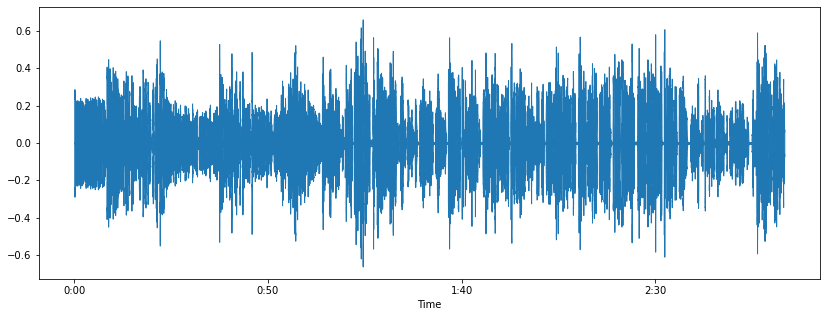

In [7]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
ipd.Audio(audio_data)

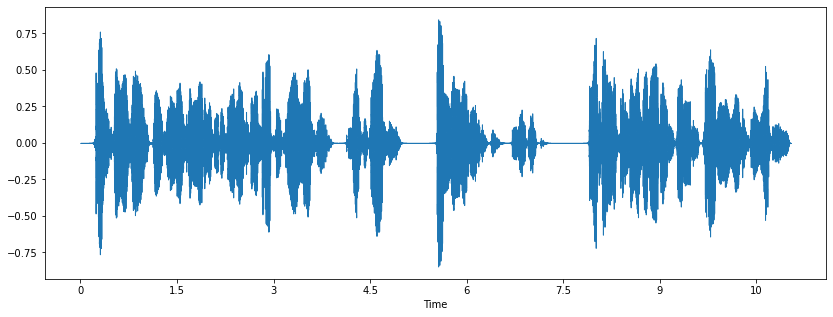

In [27]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y2, sr=sr2)
ipd.Audio(audio_data2)

In [16]:
hop_seconds = 2
window_seconds = 1
n_mfcc = 20

# Get prefpreference 

In [19]:
mfcc=librosa.feature.mfcc(y=y, sr=sr,
                          hop_length=int(hop_seconds*sr),
                          n_fft=int(window_seconds*sr),
                          n_mfcc=n_mfcc)
mfcc_delta=librosa.feature.delta(mfcc)
mfcc_delta2=librosa.feature.delta(mfcc, order=2)
stacked=np.vstack((mfcc, mfcc_delta, mfcc_delta2))
features=stacked.T #librosa возвращает где MFCC идут в ряд, а для модели нужно будет в столбец.

In [33]:
hop_length2=int(hop_seconds*sr2)
hop_length2

44100

In [35]:
mfcc2=librosa.feature.mfcc(y=y2, sr=sr2,
                          hop_length=int(hop_seconds*sr),
                          n_fft=int(window_seconds*sr),
                          n_mfcc=n_mfcc)
mfcc_delta=librosa.feature.delta(mfcc)
mfcc_delta2=librosa.feature.delta(mfcc, order=2)
stacked=np.vstack((mfcc, mfcc_delta, mfcc_delta2))
features=stacked.T #librosa возвращает где MFCC идут в ряд, а для модели нужно будет в столбец.

In [ ]:
#pip install sckit-learn

In [ ]:
#pip install sckit-datasets

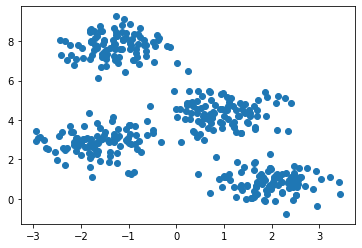

In [36]:
from sklearn.datasets import make_blobs
X, y_true=make_blobs(n_samples=400, centers=4,
                       cluster_std=0.60, random_state=0)
plt.scatter(X[:, 0], X[:, 1]);

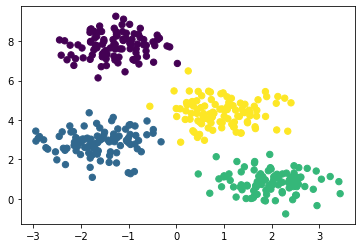

In [37]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=4)
gmm.fit(X)
labels=gmm.predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis');